# MedVision-AI

# Notebook 03

# Image Preprocessing Theory

---

## Objectives

This notebook explains why image preprocessing is essential before training a deep learning model.

### Goals

- Understand preprocessing
- Study each transformation
- Visualize the effect of every transformation
- Design the preprocessing pipeline
- Prepare for implementation

---

## What is Image Preprocessing?

Preprocessing is the process of converting raw images into a standardized format suitable for deep learning.

Raw Image

↓

Preprocessing

↓

Tensor

↓

Model

## Why Do We Need Preprocessing?

Different image sizes

↓

Resize

Different brightness

↓

Normalization

Different orientations

↓

Augmentation

Different formats

↓

RGB Conversion

## Load Image

The CNN cannot directly read image.jpeg


It must first become

PIL Image

↓

NumPy

↓

Tensor

In [2]:
import os
from pathlib import Path

import numpy as np
import pandas as pd

from PIL import Image

import matplotlib.pyplot as plt

from pathlib import Path

DATASET_PATH = Path(r"C:\MedVision-AI\dataset\chest_xray")

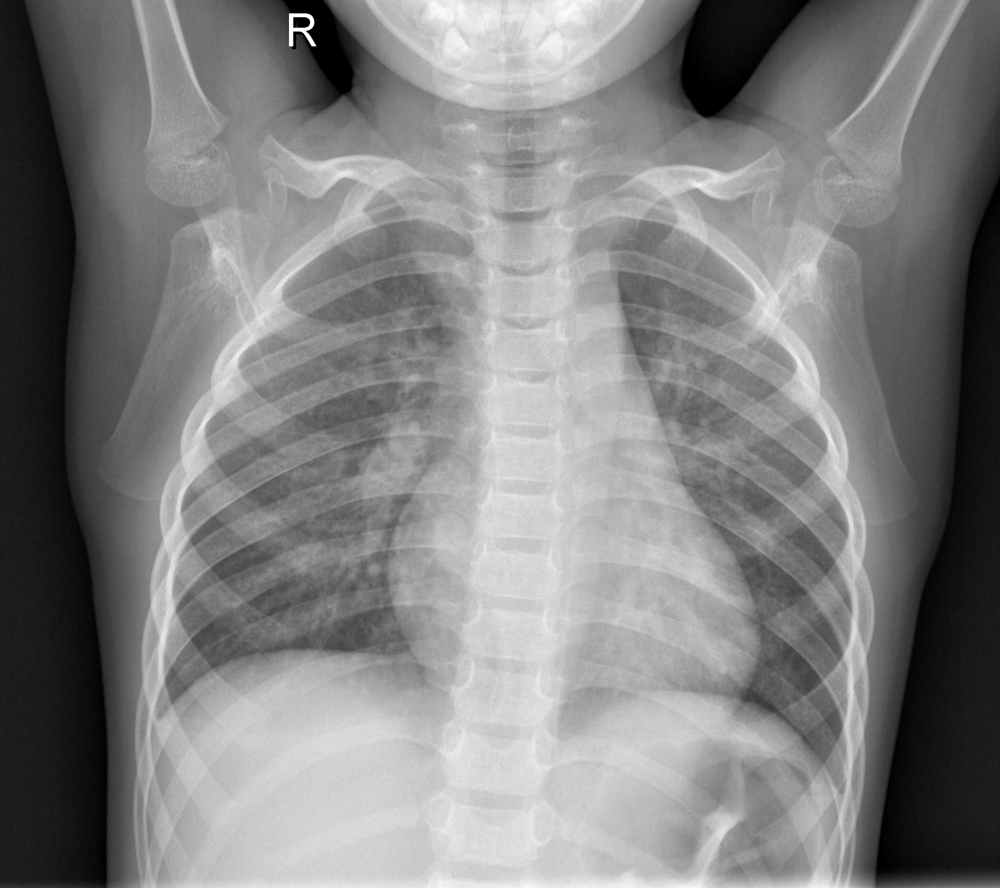

In [3]:
from PIL import Image

sample_image = DATASET_PATH / "train" / "NORMAL"

sample_image = list(sample_image.glob("*.jpeg"))[0]

img = Image.open(sample_image)

img

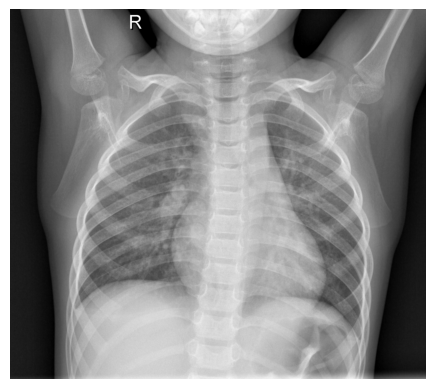

In [4]:
plt.imshow(img,cmap="gray")
plt.axis("off")
plt.show()

## Interpretation

The image is now loaded into memory.

## Convert to RGB

EfficientNet

↓

expects

↓

RGB

our data

↓

Grayscale


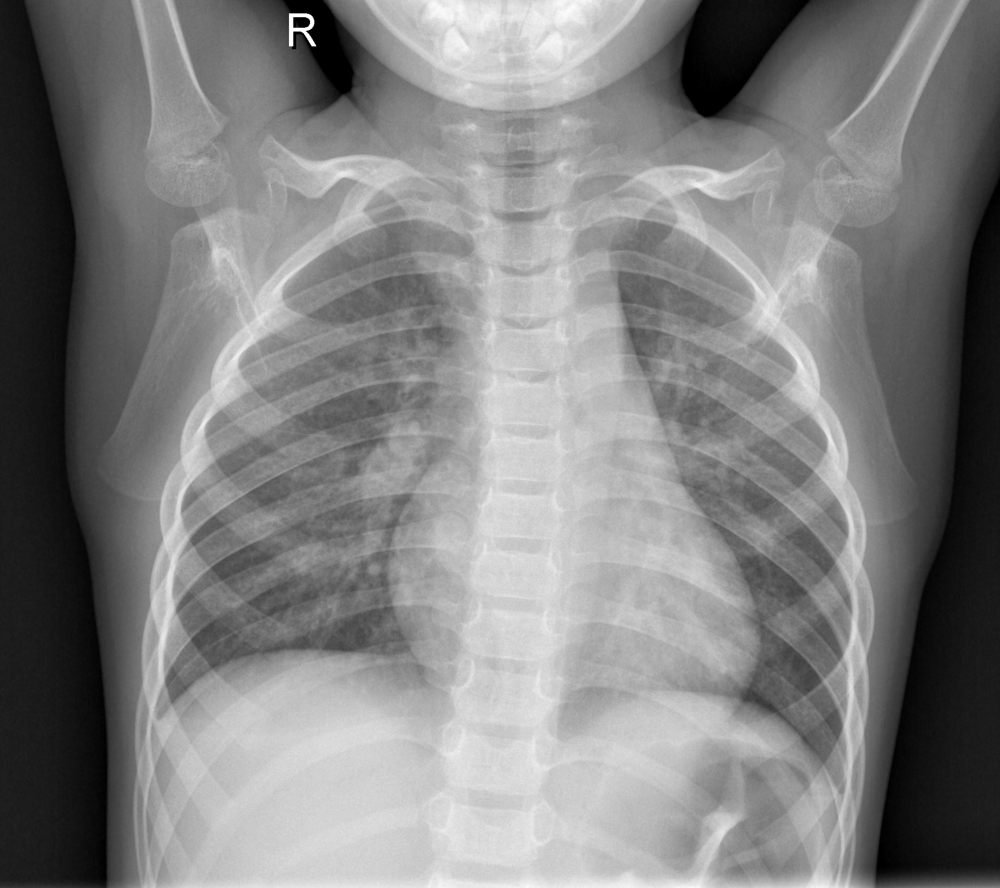

In [5]:
rgb_img = img.convert("RGB")

rgb_img

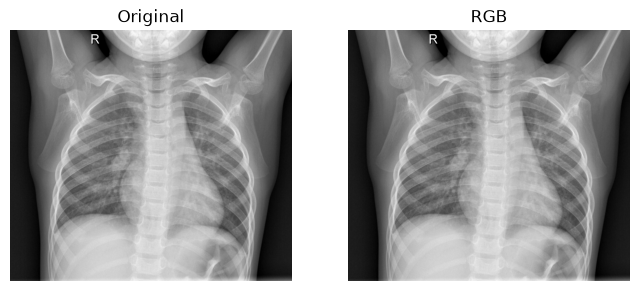

In [6]:
plt.figure(figsize=(8,4))

plt.subplot(1,2,1)

plt.imshow(img,cmap="gray")

plt.title("Original")

plt.axis("off")

plt.subplot(1,2,2)

plt.imshow(rgb_img)

plt.title("RGB")

plt.axis("off")

plt.show()

## Interpretation

Visually identical.

Internally

1 channel

↓

3 channels

## Resize


Standardize image dimensions.

## Theory

EfficientNet

↓

224×224

In [7]:
resized = rgb_img.resize((224,224))

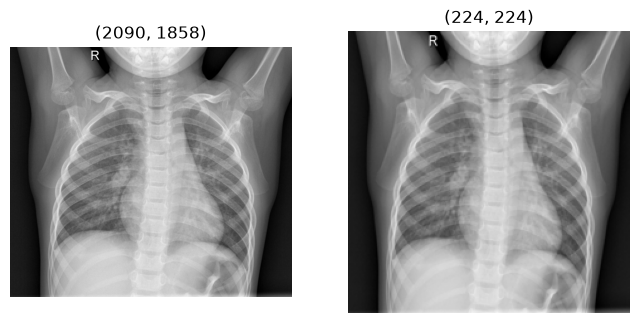

In [8]:
plt.figure(figsize=(8,4))

plt.subplot(1,2,1)

plt.imshow(rgb_img)

plt.title(rgb_img.size)

plt.axis("off")

plt.subplot(1,2,2)

plt.imshow(resized)

plt.title(resized.size)

plt.axis("off")

plt.show()

## Interpretation

Now every image has identical dimensions.

## Normalization

Understand pixel scaling.

-----------
   255

    ↓

    1
-----------

instead of

  0–255

In [9]:
img_array = np.array(resized)

print(img_array.min())

print(img_array.max())

0
249


In [10]:
normalized = img_array / 255.0

print(normalized.min())

print(normalized.max())

0.0
0.9764705882352941


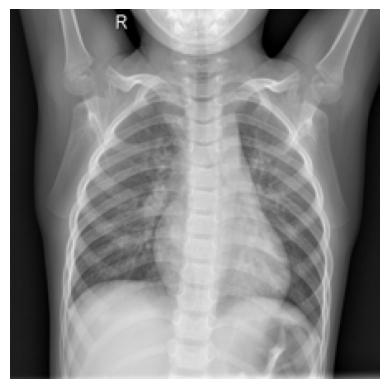

In [11]:
plt.imshow(normalized)
plt.axis("off")
plt.show()


## Interpretation

Image looks identical.

Pixel values changed.

## Data Augmentation

Increase diversity.


## Theory

Training only.

Never Validation.

Never Test.

(np.float64(-0.5), np.float64(223.5), np.float64(223.5), np.float64(-0.5))

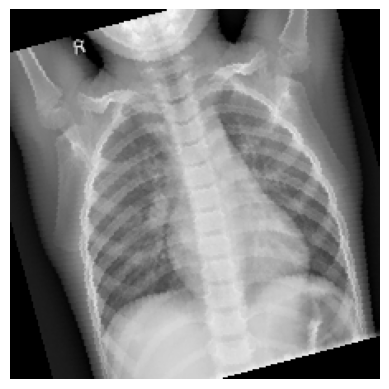

In [12]:
rotated = resized.rotate(15)

plt.imshow(rotated)
plt.axis("off")

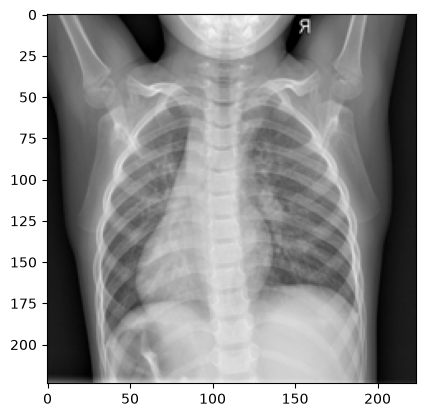

In [13]:
flipped = resized.transpose(Image.FLIP_LEFT_RIGHT)

plt.imshow(flipped)

## Interpretation

Model sees more variety.

## Tensor Conversion


Understand tensors.

## Theory
-------------------
CNN

↓

expects

↓

Tensor
-------------------

No PyTorch yet.

Instead

--------------

Image

↓

NumPy

↓

Tensor
-------------

Later

## Notebook 04

We'll actually use

ToTensor()

## Comparison Table


| Step         | Purpose                |
| ------------ | ---------------------- |
| Load         | Read image             |
| RGB          | ImageNet compatibility |
| Resize       | Fixed dimensions       |
| Normalize    | Stable training        |
| Augmentation | Reduce overfitting     |
| Tensor       | PyTorch input          |


# Conclusion

In this notebook, we studied the theory behind image preprocessing for deep learning.

### Key Learnings

- Deep learning models require standardized inputs.
- Grayscale images are converted to RGB for compatibility with pretrained ImageNet models.
- Images are resized to a fixed resolution (224 × 224) before training.
- Pixel normalization improves optimization and convergence.
- Data augmentation is applied only to the training dataset to reduce overfitting.
- The complete preprocessing pipeline was designed before implementation.

The next notebook will implement these preprocessing steps using PyTorch transforms and create reusable preprocessing modules for the MedVision-AI application.